In [2]:
import pandas as pd
import numpy as np
import dask
dask.config.set({'dataframe.query-planning': True})
import dask.dataframe as dd
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from upsetplot import UpSet
from matplotlib import pyplot
import matplotlib

In [3]:
import os

if not os.path.exists("Figures"):
    os.mkdir("Figures")

In [4]:
ddf = dd.read_parquet("../hpc-datasets/mutations.parquet", engine="pyarrow")
ddf_all_commits = dd.read_parquet("../hpc-datasets/all_commits.parquet", engine="pyarrow")
ddf_commits = dd.read_parquet("../hpc-datasets/commits_ext.parquet", engine="pyarrow")
df_repoinfos = pd.read_parquet("../hpc-datasets/repo_infos.parquet", engine="pyarrow")

In [5]:
#Correct the file depth as 0 is root directory so depth == 1
df_repoinfos['max_file_depth'] = df_repoinfos['max_file_depth']+1

In [6]:
df_github = pd.read_csv("../datasets/github_data_07_03_2024.csv",keep_default_na=False)
df_github["repo_id"] = df_github["owner.name"].str.lower() + "_" + df_github["name"].str.lower()
df_github = df_github[~df_github['ignored']]
df_github = df_github.set_index('repo_id')

In [7]:
import yaml
linguist_langs = yaml.safe_load(open("../datasets/linguist/languages.yml", "r"))

In [8]:
linguist_types = set(linguist_langs[x]['type'] for x in linguist_langs)
linguist_types

{'data', 'markup', 'programming', 'prose'}

In [56]:
gh_info_cols = ['lang', 'stargazers_count', 'owner.type']
df_repoinfos = df_repoinfos.merge(df_github[gh_info_cols], on='repo_id')
# df_repoinfos = ddf_repoinfos.compute()

## RQ 1.1: What are the key characteristics of the file structure of a software project?

### Average file tree depth

In [ ]:
# If you want to handle multiple modes and select the first or maximum, you can do:
def select_mode(modes):
    if len(modes) > 1:
        return modes.max()  # or modes.min() or modes.iloc[0] depending on your requirement
    else:
        return modes[0]

depth_occurences_commits = ddf_commits.compute().groupby(['repo_id'])["max_file_depth"].agg(lambda x: select_mode(pd.Series.mode(x)))

In [ ]:
depth_occurences_commits.mean()

5.7674727047014755

In [ ]:
depth_occurences_commits.value_counts()

max_file_depth
3     16003
4     13874
5     13021
2      8244
6      8116
9      5988
7      5589
8      5575
10     5181
11     3869
1      3156
12     2436
13     1413
14      841
15      406
16      256
17      118
18       80
19       40
20       20
21        9
22        8
23        1
24        1
28        1
26        1
Name: count, dtype: int64

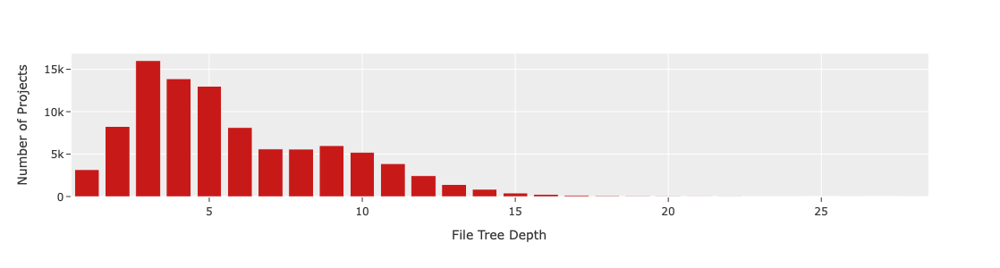

In [ ]:
fig = px.bar(depth_occurences_commits.value_counts())
fig.update_layout(template='ggplot2', height=300, width=1000, showlegend=False)
fig.update_traces(marker_color='rgb(200,25,25)')
fig.update_xaxes(title="File Tree Depth")
fig.update_yaxes(title="Number of Projects")
fig.show()# Add the distribution curve as a line plot
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
)
fig.write_image('Figures/average_file_tree_depth.pdf')

### Split the average file tree per programming language

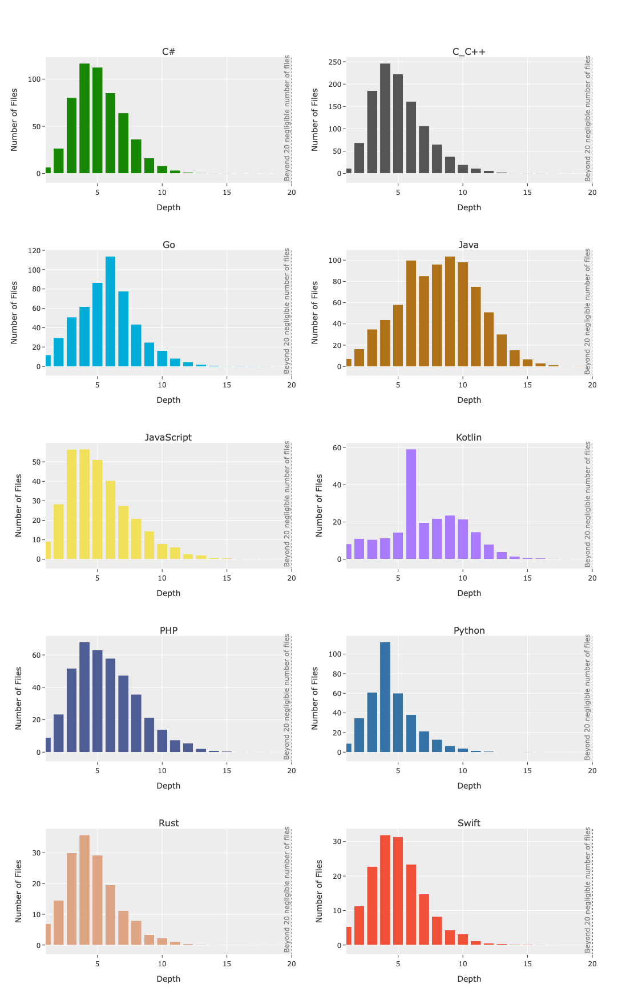

In [353]:
fig = make_subplots(cols=2, rows=5, horizontal_spacing = 0.1, vertical_spacing = 0.075, subplot_titles = df_repoinfos['lang'].sort_values().unique())
for i, lang in enumerate(df_repoinfos['lang'].sort_values().unique()):
    lang_data = df_avg_file_per_lay_piv_merge[df_avg_file_per_lay_piv_merge['lang'] == lang]
    lang_data_filled = lang_data.drop('lang', axis=1).fillna(0)
    color_lang = lang if lang != "C_C++" else "C"
    lang_name = lang if lang != "C_C++" else "C/C++"
    fig.add_trace(go.Bar(x=lang_data_filled.mean().index+1, y=lang_data_filled.mean(), name=lang_name, marker_color=linguist_langs[color_lang]['color']), col=i%2+1, row=i//2+1)
    # fig.add_vline(lang_data.drop('lang', axis=1).dropna(axis=1, how='all').columns[-1], line_dash="dot", line_color="grey", line_width=1, opacity=1, col=i%2+1, row=i//2+1)
    # fig.update_layout(title=lang, col=i%2+1, row=i//2+1)

    fig.add_vline(x=20, line_dash="dot", line_color="grey", line_width=2, opacity=1, col=i%2+1, row=i//2+1)

    # Add an annotation explaining the break
    fig.add_annotation(
        x=19.6, y=max(lang_data_filled.mean())*0.5, xref=f'x{i+1}', yref=f'y{i+1}',
        text="Beyond 20 negligible number of files", showarrow=False, font=dict(size=12, color='grey'), textangle=-90
    )


fig.update_layout(height=1750, width=1500, showlegend=False, template='ggplot2')
# fig.update_xaxes(title="Depth")
fig.update_xaxes(title="Depth", range=[1,20])
fig.update_yaxes(title="Number of Files")
fig.show()
#Mean Number of Files per Layer, for each programming langu
fig.write_image('Figures/bar_mean_no_files_per_lay_per_pc.pdf')

### Some testing

In [284]:

df_avg_file_per_lay_exploded_merge = df_avg_file_per_lay_exploded.merge(df_repoinfos[['lang']], left_on='repo_id', right_index=True)

In [285]:


print(df_avg_file_per_lay_exploded_merge[(df_avg_file_per_lay_exploded_merge['index'] == 5) & ( df_avg_file_per_lay_exploded_merge['total_files_per_level'] > 0) & (df_avg_file_per_lay_exploded_merge['lang'] == "Kotlin")][['repo_id', 'commit_id']].drop_duplicates())



                            repo_id                                 commit_id
5496           cliambrown_easynoise  6ceaa745b1eff35b23028b1a6cfe450ec0476102
5497           cliambrown_easynoise  7a526f23ac85456f1f9a38a0a6e46abc94ac01d6
5498           cliambrown_easynoise  559a909666279275cfe42a370b81ce3b07366e6f
5499           cliambrown_easynoise  817dd3b60390613f915abc5bae05a088f72e77d0
5500           cliambrown_easynoise  8878b8cff1e21e120bbc09096a7881d0597cac43
...                             ...                                       ...
144482  cssxsh_fix-protocol-version  bd044b3b49f419f32dea82ff65264af7b9ae8ca4
144483  cssxsh_fix-protocol-version  265c3dc0d5c67f2521d9869ccbab85f7242fb757
144484  cssxsh_fix-protocol-version  b2093acb202e8539a9f99676f5772a6217f99241
144485  cssxsh_fix-protocol-version  12dfb5e160713cd87b56294f023ceac5ea9c6e32
144486  cssxsh_fix-protocol-version  5aa2820531f06b2165dd9ad8fbc2e3a25a35a299

[640800 rows x 2 columns]


In [286]:


print(df_avg_file_per_lay_exploded_merge[(df_avg_file_per_lay_exploded_merge['index'] == 5) & ( df_avg_file_per_lay_exploded_merge['total_files_per_level'] > 0) & (df_avg_file_per_lay_exploded_merge['lang'] == "Kotlin")].groupby(['repo_id'])['total_files_per_level'].sum())



repo_id
05nelsonm_encoding                         436
05nelsonm_kmp-tor                          482
0ranko0p_autodark                         6510
0x4f53_wristkey                           2495
0xbad1d3a5_kaku                           4016
                                          ... 
zxj5470_bugkotlindocument                   47
zyj1609wz_startup                           63
zynkware_document-scanning-android-sdk     123
zyrouge_symphony                          5918
zyyoona7_recyclerviewitemdecoration        107
Name: total_files_per_level, Length: 7948, dtype: int64


### Maximum file tree depth

In [ ]:
df_repoinfos["max_file_depth"].describe()

count    94247.000000
mean         6.583594
std          3.522603
min          1.000000
25%          4.000000
50%          6.000000
75%          9.000000
max        123.000000
Name: max_file_depth, dtype: float64

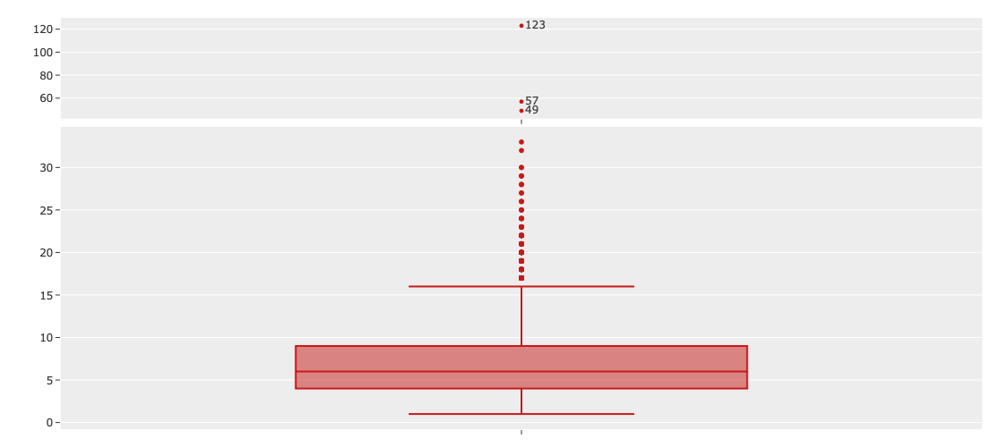

In [ ]:
fig = go.Figure()

# Filtered version
tmp_box_data = df_repoinfos["max_file_depth"]
thresh = 40

box_data = tmp_box_data[tmp_box_data <= thresh]
outlier_data = tmp_box_data[tmp_box_data > thresh]

boxplot_trace = go.Box(y=box_data, name='Data')
outlier_trace = go.Scatter(
    x=['Data']*len(outlier_data),
    y=outlier_data,
    mode='markers+text',
    marker=dict(color='red', size=5),
    text=outlier_data,
    textposition='middle right',
)

# Create the figure
fig = make_subplots(rows=2, cols=1, vertical_spacing = 0.02, row_heights=[0.25, 0.75])
fig.add_trace(boxplot_trace, row=2, col=1)

# Add outlier scatter traces to the figure
fig.add_trace(outlier_trace, row=1, col=1)

# Hide the legend
fig.update_layout(showlegend=False, height=500, width=1000, template="ggplot2")

# Hide axis labels in the upper subplot
fig.update_xaxes(showticklabels=False, showgrid=False, row=1, col=1)
fig.update_yaxes(title_text='', row=1, col=1)
fig.update_xaxes(showticklabels=False, showgrid=False, row=2, col=1)
fig.update_traces(marker_color='rgb(200, 25, 25)')

# fig.update_yaxes(title_text='Maximum file structure depth', row=2, col=1)

# Add x-axis title
# fig.update_xaxes(title_text='Maximum Project Depth', row=2, col=1)

# Synchronize y-axis ranges between subplots
# fig.update_yaxes(range=[35, outlier_data['max_file_depth'].max()+15], row=1, col=1)
# fig.update_yaxes(range=[box_data['max_file_depth'].min()-5, 35], row=2, col=1)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
)
# Show the plot
fig.show()
fig.write_image('Figures/max_file_depth.pdf')


In [ ]:
tmp_box_data.describe(percentiles=[0.25,0.5,0.75,0.90,0.95,.99,0.999])

count    94247.000000
mean         6.583594
std          3.522603
min          1.000000
25%          4.000000
50%          6.000000
75%          9.000000
90%         11.000000
95%         13.000000
99%         16.000000
99.9%       21.000000
max        123.000000
Name: max_file_depth, dtype: float64

In [ ]:
df_repoinfos["max_file_depth"].describe(percentiles=[0.25,0.5,0.75,0.90,0.95,.99])

count    94247.000000
mean         6.583594
std          3.522603
min          1.000000
25%          4.000000
50%          6.000000
75%          9.000000
90%         11.000000
95%         13.000000
99%         16.000000
max        123.000000
Name: max_file_depth, dtype: float64

In [ ]:
ddf_commits['max_file_depth_diff'].abs().describe(percentiles=[0.25,0.5,0.75,0.90,0.95,.99]).compute()

count    1.221772e+07
mean     6.482887e-02
std      5.467690e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
90%      0.000000e+00
95%      0.000000e+00
99%      2.000000e+00
max      1.230000e+02
Name: max_file_depth_diff, dtype: float64

## RQ 1.2: Are there variations in file structure depth between different programming languages?

In [ ]:
df_repoinfos[df_repoinfos["lang"] == '']

,first_commit,last_commit,no_contributors,no_commits,no_struc_changing_commits,max_file_depth,lang
repo_id,,,,,,,


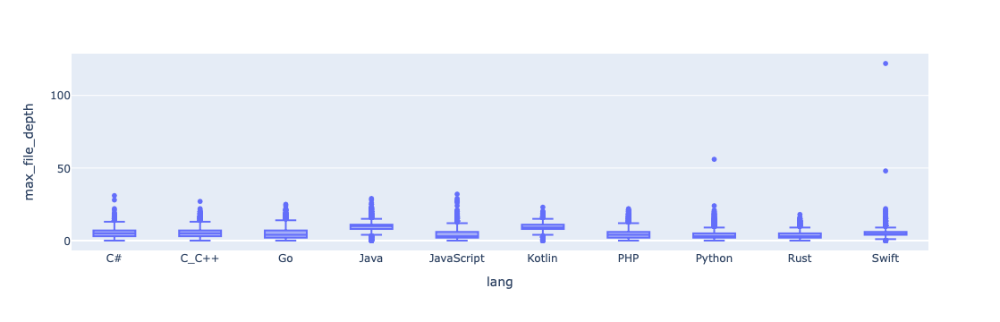

In [ ]:
fig = px.box(df_repoinfos, x='lang', y='max_file_depth')
fig.update_xaxes(categoryorder='category ascending')
fig.show()

{'C#': 'C#<br>(9292)', 'C_C++': 'C_C++<br>(9582)', 'Go': 'Go<br>(9672)', 'Java': 'Java<br>(9260)', 'JavaScript': 'JavaScript<br>(9423)', 'Kotlin': 'Kotlin<br>(9024)', 'PHP': 'PHP<br>(9613)', 'Python': 'Python<br>(9523)', 'Rust': 'Rust<br>(9684)', 'Swift': 'Swift<br>(9174)'}


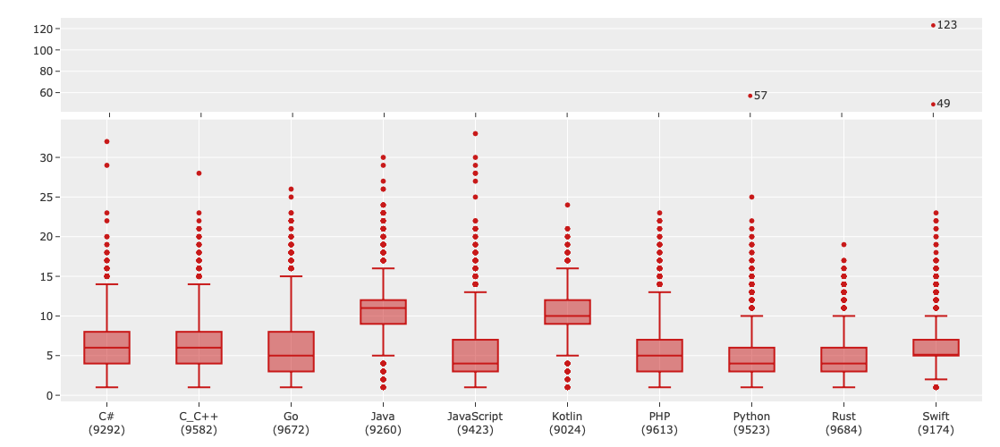

In [ ]:
# Filtered version for making the graph easier to read
tmp_box_data = df_repoinfos
thresh = 40

box_data = tmp_box_data[tmp_box_data['max_file_depth'] <= thresh]
outlier_data = tmp_box_data[tmp_box_data['max_file_depth'] > thresh]

categories = box_data.sort_values(by='lang')['lang'].unique()
count_per_lang = tmp_box_data.groupby('lang').count()['first_commit']
xlabels = {name: f"{name}<br>({count})" for name, count in count_per_lang.items()}
print (xlabels)

# Create the figure
fig = make_subplots(rows=2, cols=1, vertical_spacing = 0.02, row_heights=[0.25, 0.75])

for lang in categories:
    cat_data = box_data[box_data['lang'] == lang]
    fig.add_trace(go.Box(
        x=[xlabels[lang]] * cat_data.shape[0], 
        y=cat_data['max_file_depth']), 
                  row=2, 
                  col=1
    )

outlier_traces = []
for lang in categories:
    lang_outlier_data = outlier_data[outlier_data['lang'] == lang]
    if not lang_outlier_data.empty:
        trace = go.Scatter(
            x=[lang] * len(lang_outlier_data),
            y=lang_outlier_data['max_file_depth'],
            mode='markers+text',
            name=lang,
            marker=dict(color='red', size=5),
            text=lang_outlier_data['max_file_depth'],
            textposition='middle right',
        )
        outlier_traces.append(trace)
    else:
        # Create an empty trace with category name
        trace = go.Scatter(
            x=[lang],
            y=[None],  # Provide empty y-values
            mode='markers',
            name=lang,
            marker=dict(color='red', size=0)  # Set size to 0 for invisible markers
        )
        outlier_traces.append(trace)

fig.update_xaxes(categoryorder='category ascending', row=2, col=1)

# fig.add_trace(outliers_trace, row=1, col=1)
# Add outlier scatter traces to the figure
for trace in outlier_traces:
    fig.add_trace(trace, row=1, col=1)

# Update layout for clarity (optional)
# fig.update_layout(title='Maximum File Tree Depth per Programming Language', yaxis_title='Value')

# Hide the legend
fig.update_layout(showlegend=False, height=500, template="ggplot2", width=1000)

# Hide axis labels in the upper subplot
fig.update_xaxes(showticklabels=False, showgrid=False, row=1, col=1)
fig.update_yaxes(title_text='', row=1, col=1)
fig.update_traces(marker_color="rgb(200,25,25)")

# Synchronize y-axis ranges between subplots
# fig.update_yaxes(range=[35, outlier_data['max_file_depth'].max()+15], row=1, col=1)
# fig.update_yaxes(range=[box_data['max_file_depth'].min()-5, 35], row=2, col=1)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
)

# Show the plot
fig.show()
fig.write_image('Figures/max_file_depth_per_lang.pdf')

### Emergence of Deep File Tree Structures

In [ ]:
pcs_in_data = df_repoinfos.groupby('lang')["max_file_depth"].describe(percentiles=[0.25,0.5,0.75,0.9,0.95,0.99])

In [ ]:
pcs_in_data

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
lang,,,,,,,,,,,
C#,9292.0,6.192424,2.620345,1.0,4.0,6.0,8.0,10.0,11.0,14.0,32.0
C_C++,9582.0,6.199332,3.335301,1.0,4.0,6.0,8.0,11.0,13.0,16.0,28.0
Go,9672.0,5.924731,3.733596,1.0,3.0,5.0,8.0,11.0,13.0,18.0,26.0
Java,9260.0,10.767495,2.968576,1.0,9.0,11.0,12.0,14.0,16.0,19.0,30.0
JavaScript,9423.0,5.286321,3.047970,1.0,3.0,4.0,7.0,9.0,11.0,16.0,33.0
Kotlin,9024.0,10.440824,2.241993,1.0,9.0,10.0,12.0,13.0,14.0,17.0,24.0
PHP,9613.0,5.561635,2.971650,1.0,3.0,5.0,7.0,10.0,12.0,15.0,23.0
Python,9523.0,4.934159,2.646976,1.0,3.0,4.0,6.0,8.0,10.0,13.0,57.0
Rust,9684.0,4.716233,2.166188,1.0,3.0,4.0,6.0,7.0,9.0,12.0,19.0


In [ ]:
df_repoinfos_with_tresh = (
    df_repoinfos
    .reset_index()
    .merge(pcs_in_data[['99%']], how='left', left_on='lang', right_on='lang')
    .set_index('repo_id')
)

In [ ]:
df_repoinfos_above_thresh = (
    df_repoinfos_with_tresh[df_repoinfos_with_tresh['max_file_depth'] >= df_repoinfos_with_tresh['99%']]
        .rename(columns={ "max_file_depth": "proj_max_file_depth" })
)

In [ ]:
df_repoinfos_above_thresh

,first_commit,last_commit,no_contributors,no_commits,no_struc_changing_commits,proj_max_file_depth,lang,stargazers_count,owner.type,99%
repo_id,,,,,,,,,,
toeverything_octobase,081d8d360f2be427f962635d31755fb84afcb17d,e821e3703551425e1e608278114f254963aca4a6,29,866,255,12,Rust,1040,Organization,12.0
cutbox_cutbox,3710de547db6ea89beabef71b5c12b91c06b7bc9,94e98f1e40bf7bc39213a520f19814d02d806666,435,2062,396,16,Swift,158,Organization,14.0
alchemy-fr_phraseanet,ed0fa4a51328cee5dfcf7edd8cbe94f76a764827,e781b4e1c0e0ff370c830df9a46e3c564d23a8ab,56,3536,719,17,PHP,230,Organization,15.0
jetbrains_rd,616e0ad76dbb6df7511e94af7d2982354c2c92f9,429cb32f63f7450857af90d287a0ac716c426308,70,1231,281,14,C#,369,Organization,14.0
tauri-apps_tauri,5801b6f5fae89a4b2534385841f6e39136281712,86250a476e2ba8e0daad3c54c42ec72ce1fe8eeb,369,3362,1544,12,Rust,75536,Organization,12.0
...,...,...,...,...,...,...,...,...,...,...
zhanghandong_tao-of-rust-codes,f2ffcace3ea1a9437d8febd3f2b7c184900036d7,49d8be60c01b8900e71941d0349825e08453e557,3,127,47,12,Rust,1183,User,12.0
yamadapc_augmented-audio,3337652678457b6136027ee7c18be59dbd0ca6e4,a5f66ce2ae4c7008becbfb35e73efbfe37ab0826,5,1967,519,16,Rust,159,User,12.0
citizenfx_fivem,f44c70a15be3c45c3a41a5ec69053240b390ec77,2d73aeef4863b3ea3d6001ae9cf34cd063fd257c,320,8349,1162,16,C_C++,3257,Organization,16.0


In [ ]:
df_repoinfos_above_thresh['lang'].value_counts()

lang
Rust          156
Python        127
PHP           122
Swift         113
Go            111
Java          109
C#            107
C_C++         102
JavaScript     97
Kotlin         92
Name: count, dtype: int64

In [ ]:
outlier_projects = df_repoinfos_above_thresh.index.tolist()

Get all the commits that are part of the outlier projects

In [ ]:
outlier_project_commits = ddf_commits[ddf_commits["repo_id"].isin(outlier_projects)]

In [ ]:
outlier_project_commits = outlier_project_commits.merge(df_repoinfos_above_thresh[["proj_max_file_depth", "lang"]], on="repo_id")

In [ ]:
# Remove initial commits, only commits that happen later in the evolution
outlier_project_commits = outlier_project_commits[outlier_project_commits["parents"] != '']

In [ ]:
outlier_project_commits.head()

,repo_id,commit_id,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,max_file_depth_diff,bucket,proj_max_file_depth,lang
1,serverless_serverless,99880fef4dca558b50c8f522285b9d446a7a9716,1,1429597084,changes,b297fcb835428108bd1b4e75cb519c0fabff39fa,2,6,0,0,8,"11,2,18,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0",5,41,0.0,0,22,JavaScript
2,serverless_serverless,f66e71cd51922a828d943afc5f301af7bfeb75dd,2,1429810472,changes,99880fef4dca558b50c8f522285b9d446a7a9716,1,0,0,0,1,"11,2,19,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0",5,42,0.0,0,22,JavaScript
3,serverless_serverless,88aef8a332cf1d3dc710b2b8f05b8d4865132836,3,1429812258,changes,f66e71cd51922a828d943afc5f301af7bfeb75dd,1,0,0,0,1,"11,2,20,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0",5,43,0.0,0,22,JavaScript
4,serverless_serverless,c8c5e9c2c844b1e68d3d5d36d12b074bb5a5c879,7,1429840852,Add Lambdas boilerplate,11ddec4a6771e17e328b30d8a0e9d92d4a1e334f,4,2,0,0,6,"11,2,22,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0",5,45,0.0,0,22,JavaScript
5,serverless_serverless,e474e6822c1de776e35b65e236f80ace612f81ee,33,1430089389,Changes,a9782017e4083a123fcc1c05605bc7f7fda5702d,6,5,0,1,12,"9,2,25,8,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0",5,46,0.0,0,22,JavaScript


In [ ]:
df_intro_commits = outlier_project_commits[(outlier_project_commits["max_file_depth"] == outlier_project_commits["proj_max_file_depth"]) & (outlier_project_commits["max_file_depth_diff"] > 0)].compute()

In [ ]:
df_intro_commits

,repo_id,commit_id,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,max_file_depth_diff,bucket,proj_max_file_depth,lang
14,serverless_serverless,874734b048687fd14e0209fc7b1653d442da8907,52,1437975421,updates,28f090f67b413a558acd022704af5f99e4952272,1155,1,0,0,1156,"5,10,7,8,4,3,5,81,706,87,66,14,4,23,5,45,29,51...",22,1185,17.0,0,22,JavaScript
2288,tauri-apps_tauri,535f223eca8961fa9aa9f4a12aae2ab5904bf0e0,2793,1686915562,Merge pull request #7214 from tauri-apps/next ...,"28921cb8e89351ba04f8c19b7ae9c9abcd5a0d4c,6b81d...",417,98,69,0,584,"16,249,204,156,136,125,78,67,30,17,38,4",12,1120,2.0,0,12,Rust
2620,droiter_openwrt-on-android,0c0e2192ac08f8daa76d08f17d0a114210ee3eff,1,1452354999,The beginning,3117487d129a9f2cac8d59ea8fd14b5e4df4f8b0,12615,0,0,0,12615,"1,3,18,77,137,2473,3421,1378,801,1160,1654,814...",19,12616,18.0,0,19,PHP
2636,facebookresearch_home-robot,e0ac319363fb704b7de2593340d9f94136b70864,28,1675878188,Home robot dev main (#29) * Move stuff * M...,d149698d5f50e77f2b16a6515a479916ef089c43,223,0,4,0,227,"9,16,22,22,22,56,10,31,66,42,77,20,25,5",14,423,3.0,0,14,Python
3404,eclipse_kapua,a3db71e55f3d2b0e774e06cc753b92c20d551488,2717,1615795831,Merge pull request #3264 from Coduz/feature-in...,"874d57cdffd9d216e3f473bd2efb911fb1e188dd,99e96...",66,0,33,0,99,"9,33,117,200,104,120,109,390,256,279,350,437,4...",20,4899,1.0,0,20,Java
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3814,insou22_mipsy,9207f5f58effb9cfc3fdb6bab62d3f196a2b6879,198,1645351486,Spanishpear/feat/monaco (#141) * fix eof brea...,7352bdba1caba50b26248931181ce5db48f862b9,22,0,0,1,23,"8,3,74,33,31,27,1,12,2,0,0,1",12,192,6.0,79,12,Rust
3851,zhanghandong_tao-of-rust-codes,09c9710b2febea11529d2248e34ec8d775713707,25,1537338078,add ch10,7fc77bd0ab116a0f682547c85f67908db31c736f,1272,0,0,0,1272,"3,6,60,10,35,85,211,307,596,7,17,6",12,1343,7.0,79,12,Rust
4053,gitana_alpaca,2199602518d32186f441eeb6d735033f7744fd93,691,1475176699,alpaca release build 1.5.20,5fd1ba28849b2c41777a21d119f645503a107753,2324,0,0,0,2324,"16,24,148,766,1819,1448,3077,424,298,360,349,3...",18,9490,8.0,79,18,JavaScript
6195,solo-io_gloo,20ef52e64e654f2c85412ca8cfbcca8ad881895a,2696,1684360931,DCP control plane (#8136) Add support for new...,16b747959ecca8e414ad34428f15b667e8956b13,84,0,0,2,86,"14,31,2091,312,604,573,347,273,147,136,55,81,3...",19,4872,1.0,79,19,Go


Find the mutations that caused the depth to increase;
Notice, we only store a single path as there could be very very many per commit, but should be enough to determine what happened!

In [ ]:
tmp_muts = ddf[ddf['repo_id'].isin(df_intro_commits['repo_id']) & ddf['commit_id'].isin(df_intro_commits['commit_id'])].compute()

In [ ]:
grouped_tmp_muts = tmp_muts.set_index(['repo_id', 'commit_id', 'new_file_depth'])

In [ ]:
tmp_intro_commits = df_intro_commits
tmp_intro_commits['new_file_depth'] = tmp_intro_commits['max_file_depth']-1
tmp_intro_commits = tmp_intro_commits.set_index(['repo_id', 'commit_id', 'new_file_depth'])
tmp_intro_commits

,,,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,max_file_depth_diff,bucket,proj_max_file_depth,lang
repo_id,commit_id,new_file_depth,,,,,,,,,,,,,,,,
serverless_serverless,874734b048687fd14e0209fc7b1653d442da8907,21,52,1437975421,updates,28f090f67b413a558acd022704af5f99e4952272,1155,1,0,0,1156,"5,10,7,8,4,3,5,81,706,87,66,14,4,23,5,45,29,51...",22,1185,17.0,0,22,JavaScript
tauri-apps_tauri,535f223eca8961fa9aa9f4a12aae2ab5904bf0e0,11,2793,1686915562,Merge pull request #7214 from tauri-apps/next ...,"28921cb8e89351ba04f8c19b7ae9c9abcd5a0d4c,6b81d...",417,98,69,0,584,"16,249,204,156,136,125,78,67,30,17,38,4",12,1120,2.0,0,12,Rust
droiter_openwrt-on-android,0c0e2192ac08f8daa76d08f17d0a114210ee3eff,18,1,1452354999,The beginning,3117487d129a9f2cac8d59ea8fd14b5e4df4f8b0,12615,0,0,0,12615,"1,3,18,77,137,2473,3421,1378,801,1160,1654,814...",19,12616,18.0,0,19,PHP
facebookresearch_home-robot,e0ac319363fb704b7de2593340d9f94136b70864,13,28,1675878188,Home robot dev main (#29) * Move stuff * M...,d149698d5f50e77f2b16a6515a479916ef089c43,223,0,4,0,227,"9,16,22,22,22,56,10,31,66,42,77,20,25,5",14,423,3.0,0,14,Python
eclipse_kapua,a3db71e55f3d2b0e774e06cc753b92c20d551488,19,2717,1615795831,Merge pull request #3264 from Coduz/feature-in...,"874d57cdffd9d216e3f473bd2efb911fb1e188dd,99e96...",66,0,33,0,99,"9,33,117,200,104,120,109,390,256,279,350,437,4...",20,4899,1.0,0,20,Java
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
insou22_mipsy,9207f5f58effb9cfc3fdb6bab62d3f196a2b6879,11,198,1645351486,Spanishpear/feat/monaco (#141) * fix eof brea...,7352bdba1caba50b26248931181ce5db48f862b9,22,0,0,1,23,"8,3,74,33,31,27,1,12,2,0,0,1",12,192,6.0,79,12,Rust
zhanghandong_tao-of-rust-codes,09c9710b2febea11529d2248e34ec8d775713707,11,25,1537338078,add ch10,7fc77bd0ab116a0f682547c85f67908db31c736f,1272,0,0,0,1272,"3,6,60,10,35,85,211,307,596,7,17,6",12,1343,7.0,79,12,Rust
gitana_alpaca,2199602518d32186f441eeb6d735033f7744fd93,17,691,1475176699,alpaca release build 1.5.20,5fd1ba28849b2c41777a21d119f645503a107753,2324,0,0,0,2324,"16,24,148,766,1819,1448,3077,424,298,360,349,3...",18,9490,8.0,79,18,JavaScript


In [ ]:
df_intro_commits = tmp_intro_commits.merge(
    grouped_tmp_muts[['new_path']],
    left_index=True,
    right_index=True,
    how='left'
).reset_index().drop_duplicates(['repo_id', 'commit_id', 'new_file_depth']).rename(columns={'new_path': 'long_path'})
df_intro_commits.head()

,repo_id,commit_id,new_file_depth,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,max_file_depth_diff,bucket,proj_max_file_depth,lang,long_path
0,serverless_serverless,874734b048687fd14e0209fc7b1653d442da8907,21,52,1437975421,updates,28f090f67b413a558acd022704af5f99e4952272,1155,1,0,0,1156,"5,10,7,8,4,3,5,81,706,87,66,14,4,23,5,45,29,51...",22,1185,17.0,0,22,JavaScript,api/users/signup/node_modules/jaws-lib/node_mo...
4,tauri-apps_tauri,535f223eca8961fa9aa9f4a12aae2ab5904bf0e0,11,2793,1686915562,Merge pull request #7214 from tauri-apps/next ...,"28921cb8e89351ba04f8c19b7ae9c9abcd5a0d4c,6b81d...",417,98,69,0,584,"16,249,204,156,136,125,78,67,30,17,38,4",12,1120,2.0,0,12,Rust,examples/api/src-tauri/tauri-plugin-sample/and...
8,droiter_openwrt-on-android,0c0e2192ac08f8daa76d08f17d0a114210ee3eff,18,1,1452354999,The beginning,3117487d129a9f2cac8d59ea8fd14b5e4df4f8b0,12615,0,0,0,12615,"1,3,18,77,137,2473,3421,1378,801,1160,1654,814...",19,12616,18.0,0,19,PHP,files/www/owncloud/apps/files_external/3rdpart...
12,facebookresearch_home-robot,e0ac319363fb704b7de2593340d9f94136b70864,13,28,1675878188,Home robot dev main (#29) * Move stuff * M...,d149698d5f50e77f2b16a6515a479916ef089c43,223,0,4,0,227,"9,16,22,22,22,56,10,31,66,42,77,20,25,5",14,423,3.0,0,14,Python,src/home_robot/home_robot/agent/perception/det...
17,eclipse_kapua,a3db71e55f3d2b0e774e06cc753b92c20d551488,19,2717,1615795831,Merge pull request #3264 from Coduz/feature-in...,"874d57cdffd9d216e3f473bd2efb911fb1e188dd,99e96...",66,0,33,0,99,"9,33,117,200,104,120,109,390,256,279,350,437,4...",20,4899,1.0,0,20,Java,service/device/management/inventory/internal/s...


We check that there are no commits where it could not find a mutation with this long of a path. This is to check the bug is gone, which we found late in the process of analysis and we had to retrieve new dataset.

In [ ]:
commits_with_no_path = df_intro_commits[df_intro_commits['long_path'].isna()]
assert(len(commits_with_no_path) == 0)

In [ ]:
df_intro_commits["node_modules"] = df_intro_commits["long_path"].str.contains("node_modules/", case=False)

In [ ]:
df_intro_commits["vendor"] = df_intro_commits["long_path"].str.contains("vendor/", case=False)

In [ ]:
df_intro_commits["pods"] = df_intro_commits["long_path"].str.contains("pods/", case=False)

In [ ]:
df_intro_commits["python-packages"] = df_intro_commits["long_path"].str.contains("site-packages/", case=False) | df_intro_commits["long_path"].str.contains("dist-packages/", case=False)

In [ ]:
df_intro_commits["carthage"] = df_intro_commits["long_path"].str.contains("carthage/", case=False)

In [ ]:
df_intro_commits["tests"] = df_intro_commits["long_path"].str.contains("tests/|test/|Fixtures/", case=False)

In [ ]:
df_intro_classified = pd.read_excel('INTRO_COMMIT_REASON5.xlsx')

In [ ]:
df_intro_commits = df_intro_commits.merge(df_intro_classified[['repo_id', 'commit_id', 'Reason 1', 'Reason 2']],
                                                              how='left',
                                                              on=['repo_id', 'commit_id']
                                                             )

In [ ]:
df_intro_commits

,repo_id,commit_id,new_file_depth,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,...,lang,long_path,node_modules,vendor,pods,python-packages,carthage,tests,Reason 1,Reason 2
0,serverless_serverless,874734b048687fd14e0209fc7b1653d442da8907,21,52,1437975421,updates,28f090f67b413a558acd022704af5f99e4952272,1155,1,0,...,JavaScript,api/users/signup/node_modules/jaws-lib/node_mo...,True,False,False,False,False,False,Node Modules,NaN
1,tauri-apps_tauri,535f223eca8961fa9aa9f4a12aae2ab5904bf0e0,11,2793,1686915562,Merge pull request #7214 from tauri-apps/next ...,"28921cb8e89351ba04f8c19b7ae9c9abcd5a0d4c,6b81d...",417,98,69,...,Rust,examples/api/src-tauri/tauri-plugin-sample/and...,False,False,False,False,False,True,Tests,NaN
2,droiter_openwrt-on-android,0c0e2192ac08f8daa76d08f17d0a114210ee3eff,18,1,1452354999,The beginning,3117487d129a9f2cac8d59ea8fd14b5e4df4f8b0,12615,0,0,...,PHP,files/www/owncloud/apps/files_external/3rdpart...,False,False,False,False,False,True,Resource,NaN
3,facebookresearch_home-robot,e0ac319363fb704b7de2593340d9f94136b70864,13,28,1675878188,Home robot dev main (#29) * Move stuff * M...,d149698d5f50e77f2b16a6515a479916ef089c43,223,0,4,...,Python,src/home_robot/home_robot/agent/perception/det...,False,False,False,False,False,False,Resource,NaN
4,eclipse_kapua,a3db71e55f3d2b0e774e06cc753b92c20d551488,19,2717,1615795831,Merge pull request #3264 from Coduz/feature-in...,"874d57cdffd9d216e3f473bd2efb911fb1e188dd,99e96...",66,0,33,...,Java,service/device/management/inventory/internal/s...,False,False,False,False,False,False,Normal,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1120,insou22_mipsy,9207f5f58effb9cfc3fdb6bab62d3f196a2b6879,11,198,1645351486,Spanishpear/feat/monaco (#141) * fix eof brea...,7352bdba1caba50b26248931181ce5db48f862b9,22,0,0,...,Rust,crates/mipsy_web/_static/package/min/vs/base/b...,False,False,False,False,False,False,Resource,NaN
1121,zhanghandong_tao-of-rust-codes,09c9710b2febea11529d2248e34ec8d775713707,11,25,1537338078,add ch10,7fc77bd0ab116a0f682547c85f67908db31c736f,1272,0,0,...,Rust,src/ch10/csv_challenge/target/debug/build/proc...,False,False,False,False,False,False,Generated,NaN
1122,gitana_alpaca,2199602518d32186f441eeb6d735033f7744fd93,17,691,1475176699,alpaca release build 1.5.20,5fd1ba28849b2c41777a21d119f645503a107753,2324,0,0,...,JavaScript,dist/lib/pick-a-color-m/node_modules/grunt-con...,True,False,False,False,False,True,Node Modules,NaN
1123,solo-io_gloo,20ef52e64e654f2c85412ca8cfbcca8ad881895a,18,2696,1684360931,DCP control plane (#8136) Add support for new...,16b747959ecca8e414ad34428f15b667e8956b13,84,0,0,...,Go,docs/content/reference/api/github.com/solo-io/...,False,False,False,False,False,False,Normal,NaN


In [ ]:
# Update reasons
df_intro_commits.loc[df_intro_commits["node_modules"]& (df_intro_commits['Reason 1'] == ''), "Reason 1"] = "Node Modules"
df_intro_commits.loc[df_intro_commits["vendor"]& (df_intro_commits['Reason 1'] == ''), "Reason 1"] = "Vendor"
df_intro_commits.loc[df_intro_commits["pods"]& (df_intro_commits['Reason 1'] == ''), "Reason 1"] = "Pods"
df_intro_commits.loc[df_intro_commits["python-packages"]& (df_intro_commits['Reason 1'] == ''), "Reason 1"] = "Python Packages"
df_intro_commits.loc[df_intro_commits["carthage"]& (df_intro_commits['Reason 1'] == ''), "Reason 1"] = "Carthage"
df_intro_commits.loc[df_intro_commits["tests"]& (df_intro_commits['Reason 1'] == ''), "Reason 1"] = "Tests"

In [ ]:
df_intro_commits.to_excel('INTRO_COMMIT_REASON_UNCLASSIFIED.xlsx')

If code is skipped to generate the intro commits with the automated reasons, this is to import the manually classified file:

In [ ]:
df_intro_classified = pd.read_excel('INTRO_COMMIT_REASON5.xlsx')

If the specific package manager is not interesting for the analysis, set all the package manager reasons to "Vendor", which is to denote some kind of package manager is used.

In [ ]:
df_intro_classified.loc[df_intro_classified['Reason 1'].isin(['Node Modules', 'Vendor',"Pods","Python Packages","Carthage"]),"Reason 1"] = "Vendor"

In [ ]:
len(df_intro_classified)

1125

In [ ]:
df_intro_classified['Reason 1'].value_counts(),df_intro_classified['Reason 1'].value_counts()/len(df_intro_classified)*100

(Reason 1
 Vendor        389
 Normal        251
 Resource      215
 Tests         181
 Generated      60
 Subproject     23
 Error           6
 Name: count, dtype: int64,
 Reason 1
 Vendor        34.577778
 Normal        22.311111
 Resource      19.111111
 Tests         16.088889
 Generated      5.333333
 Subproject     2.044444
 Error          0.533333
 Name: count, dtype: float64)

In [ ]:
df_intro_classified["node_modules"].sum()

126

In [ ]:
df_intro_classified[df_intro_classified["node_modules"]]["lang"].value_counts()

lang
JavaScript    64
Python        11
PHP           10
Rust          10
Java           9
C_C++          8
C#             5
Swift          4
Go             3
Kotlin         2
Name: count, dtype: int64

In [ ]:
df_intro_classified[df_intro_classified["node_modules"] & (df_intro_classified["lang"]=="Python")]

,Column1,repo_id,commit_id,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,...,lang,long_path,Reason 1,Reason 2,node_modules,vendor,pods,python-packages,carthage,tests
183,183,googlecloudplatform_professional-services,364602497898c4f858238b93539a7b7793a71bea,206,1570119184,Tool to moderate the content of audio files fo...,9cb3a3ecdce715c75a24eb8d9d28a5b20cb9936a,43749,0,0,...,Python,examples/ml-audio-content-profiling/app/angula...,Vendor,NaN,True,False,False,False,False,True
332,332,mozilla_dxr,a7e2e99072eb8d58ccd93049a8ce60e49e3d5c50,1071,1449007251,Replace Vagrant with Docker. Fix bug 1139516. ...,"f103f6fd252d68fa0508c9f7f2fce1a67df7cca0,06013...",14,11,446,...,Python,tooling/node/node_modules/lockdown/node_module...,Vendor,NaN,True,False,False,False,False,True
474,474,dunossauro_live-de-python,f90cddd2d0f53089faa4a6611a40403f6a1591dc,221,1634694199,Live 178 e 179\n,eaf4a6345045c0efbef547faef25fdfb79d4c71f,4722,0,0,...,Python,codigo/Live178/tarefas_app/node_modules/@redoc...,Vendor,NaN,True,False,False,False,False,True
531,531,mobilechromeapps_mobile-chrome-apps,e8503077b7192127cd03857d88ad1e5331a0d413,153,1378773641,Merge branch 'dev'\n\nConflicts:\n\tchrome-cor...,"597782708cbc90591c56fa3da756e68985091a9c,5e827...",7417,0,0,...,Python,node_modules/cordova/node_modules/plugman/node...,Vendor,NaN,True,False,False,False,False,True
551,551,muammar_mkchromecast,a85bf162f746e8921c1190bda893192f5febac6b,355,1466124182,node updated to v6.2.1\n,7e3f43de3e165d60ffe2233cbf9ae8e6e29acbdb,2547,938,721,...,Python,nodejs/node-6.2.1/lib/node_modules/npm/node_mo...,Vendor,NaN,True,False,False,False,False,False
552,552,muammar_mkchromecast,a278c22a99d9776e46b48ae0612a0bef82c1bd1a,541,1472826393,Added node-6.5.0 directory.\n,b65a8790e9f781a066096c31343504bf076d420a,2764,0,0,...,Python,nodejs/node-6.5.0/lib/node_modules/npm/node_mo...,Vendor,NaN,True,False,False,False,False,False
601,601,django-webpack_django-webpack-loader,f8f3eec70ce5ce1797884c8fed124b4bb3ba2009,18,1432372239,Fixed `file` key missing in stats file issues\...,3cd536d6451730ac53271ce4e4f9f37ff5135c18,17412,0,26,...,Python,examples/code-splitting/node_modules/webpack/n...,Vendor,NaN,True,False,False,False,False,False
719,719,sindresorhus_sublime-autoprefixer,e00c39c649832d9ef731b3c3399494a2bd062909,1,1367016176,node_modules\n,f848bb319c53db4a38b52f0546abb6e2c4283836,844,0,0,...,Python,autoprefixer/node_modules/component/node_modul...,Vendor,NaN,True,False,False,False,False,True
745,745,zhaoolee_starsandclown,9a873d5d883dc97c29e7f05f91d50e412f015d7e,258,1566730176,ok\n,23e7ee3b3c12aa263e6646184c45bfd2ef0b7865,8512,0,29,...,Python,node_modules/npm/node_modules/pacote/node_modu...,Vendor,NaN,True,False,False,False,False,False
753,753,ai-citizen_solidgpt,15991665173d4413d66db3056e03ab9690abfcda,18,1692564895,Initial commit for front end UI (#8)\n\n* Init...,8ce987e4c07c64b27b85471dd9ab30330c364ce6,36899,0,0,...,Python,WorkspacePortal/node_modules/@storybook/addon-...,Vendor,NaN,True,False,False,False,False,False


In [ ]:
df_intro_classified[df_intro_classified["vendor"]]["lang"].value_counts()

lang
Go            81
PHP           48
Python        15
Rust          13
JavaScript     8
C_C++          8
Swift          7
C#             3
Java           3
Name: count, dtype: int64

In [ ]:
df_intro_commits[df_intro_commits["vendor"] & (df_intro_commits["lang"]=="Python")]

,repo_id,commit_id,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,max_file_depth_diff,bucket,proj_max_file_depth,lang,long_path,node_modules,vendor
38663,aws_aws-sam-cli,ae9aa93fe6ca64f8a10c2ce48754055b034e0267,1639037173,test: Add integration tests for sam local comm...,036552ddff5c56ce5a4f8060d1e946f7b903e420,117,0,0,0,117,"31,39,37,269,477,263,328,63,22,11,1,15,68,3",14,1627,2.0,17,13,Python,tests/integration/testdata/invoke/cdk/sample-c...,False,True
1604,wonderworks-software_pyflow,a58c3662829529be5dbbc30a39ec0b1e61a0b065,1511985430,Renaming. Refactoring. New folder structure,5155a1ffdc98b50ecd707c82bd1d818538fec56e,3161,3169,1723,0,8053,"12,29,78,358,1070,1188,890,391,419,305,123,29,2",13,4894,1.0,18,12,Python,PyFlow/Python27/Lib/site-packages/pip-8.1.2-py...,False,True
2452,wistbean_learn_python3_spider,317368a6b8808e63a07b8b7d1866cf398d4541fd,1573322230,update readme,346a2d5cef8b25109247ce14165e9a701e51cd80,3982,0,0,0,3982,"10,42,19,36,6,6,529,978,1216,832,352,35,3",13,4064,8.0,20,12,Python,stackoverflow/venv/lib/python3.6/site-packages...,False,True
1916,prettyprinted_youtube_video_code,bcae46d19eab612a245db5265a74533a037be947,1627482754,added django select related video,4bd3a0a63d34850cf383357658527ac638444912,7394,0,0,0,7394,"2,0,0,1,155,248,246,488,309,222,300,399,1401,1...",19,9137,6.0,22,18,Python,2021/07/28/How to Use Select Related and Prefe...,False,True
1027,ansible_awx,1b242926e9c55a9a4ae65a2b5d5f7552d1eb46f8,1397502661,Added socket.io lib. Created a temporary Socke...,54aabb75cddcf528cb6277ec5b0d5cd999020b56,166,0,0,0,166,"14,74,42,82,454,1890,1514,779,625,34,2,0,13,96",14,5619,3.0,24,13,Python,awx/ui/static/lib/socket.io-client/lib/vendor/...,False,True
1127,ansible_awx,0c336728f482a9ad9ca26e63288184c47d387147,1409252906,Socket.io Downgraded library to 0.9.16. Versio...,264ad62db0dd66b2f3b7406dd956c73785a45eb0,164,0,15,0,179,"15,85,55,107,613,2146,1900,1068,1976,34,2,0,13,96",14,8110,3.0,24,13,Python,awx/ui/static/lib/socket.io-client/lib/vendor/...,False,True
1189,ansible_awx,e353daadb72ac8d17ffe4be901d2788daec6bc4b,1424721189,Revert accidental socket.io upgrade,7d5fccb85b2feeec8d912b077025b4fe3ffef8ea,156,15,0,0,171,"16,92,66,123,655,2178,1733,1066,1981,35,2,0,13,96",14,8056,3.0,24,13,Python,awx/ui/static/lib/socket.io-client/lib/vendor/...,False,True
13772,anzhihe_learning,057291bcaee8c8326cd0c482343c848ac86e63c7,1661705447,add Python之Django篇第六、七季：Web开发实战+用户登录模块,660d1add1bda3294695a5042fe719d8226617a36,6079,66,0,0,6145,"2,6,82,603,1430,1169,996,1056,1354,745,1460,19...",18,16818,1.0,26,17,Python,python/practise/Python之Django篇第六、七季：Web开发实战+用户...,False,True
1864,azure_azure-sdk-for-python,4c50b69c38bc79d8a36b322371943aec04ec637b,1583453893,[Event Hubs] Port azure storage blob code into...,5ec59dd29f980f0825c2972d793a0e31893d1e51,130,0,0,0,130,"16,15,199,1711,711,3232,1149,4557,3271,687,105...",14,15771,2.0,50,13,Python,sdk/eventhub/azure-eventhub-checkpointstoreblo...,False,True
38,linxid_machine_learning_study_path,5fa21e6178cab5f9238a8751b393ab77e1cf2732,1526420540,调整,73b6ff5a357b3ea411212ed12c393fe8a6230d70,4775,1,7,0,4783,"0,4,53,40,471,391,1208,1391,462,326,202,176,52,6",14,4782,12.0,57,13,Python,Machine Learning In Action/Chapter4-NaiveBayes...,False,True


In [ ]:
df_intro_commits[df_intro_commits["site-packages"]]["lang"].value_counts()

lang
Python        15
C_C++          2
Rust           2
Swift          1
C#             1
JavaScript     1
Name: count, dtype: int64

In [ ]:
df_intro_commits[df_intro_commits["site-packages"] & (df_intro_commits["lang"]=="C_C++")]

,repo_id,commit_id,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,...,max_file_depth,total_files,max_file_depth_diff,bucket,proj_max_file_depth,lang,long_path,node_modules,vendor,site-packages
8174,holzschu_a-shell,c04d5e81d32f128e890b576c030f7f68c0e9ea47,1607120415,Resources for a-Shell mini,22ebe0ea737b84d3dbae29855dd49314933f523c,7162,0,0,0,7162,...,16,23563,4.0,33,15,C_C++,Resources_mini/Library/lib/python3.9/site-pack...,False,False,True
5096,aws_lumberyard,164512f8d415d6bdf37e195af319ffe5f96a8f0b,1513225738,Lumberyard Release 1.12.0.0 Binaries ...,6fef201546019126306a6b47d5b9e1f2d82d56ae,1290,245,132,16,1683,...,19,26577,3.0,44,18,C_C++,dev/Tools/Python/2.7.13/mac/Python.framework/V...,False,True,True


In [ ]:
df_intro_commits[df_intro_commits["pods"]]["lang"].value_counts()

lang
Swift     29
Kotlin     3
Rust       1
Go         1
Name: count, dtype: int64

In [ ]:
df_intro_commits[df_intro_commits["pods"] & (df_intro_commits["lang"]=="Kotlin")]

,repo_id,commit_id,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,...,total_files,max_file_depth_diff,bucket,proj_max_file_depth,lang,long_path,node_modules,vendor,site-packages,pods
3169,touchlab_droidconkotlin,b1d5deaa75ce5951ae0f6cd2ba4adad62bf94243,1566521284,Merge pull request #125 from touchlab/kpg/nyc ...,"324f0d274ce9e2cc0641f954d6a211ff3fed4cae,6fbcc...",4557,4,5,0,4566,...,6365,6.0,7,16,Kotlin,iosApp/Pods/gRPC-C++/src/core/ext/filters/clie...,False,False,False,True
3140,oss-review-toolkit_ort,9e4b33fe2ce4525028a70d9e23a1c90ade09194b,1678730178,build(Pub): Move the Pub package manager to it...,4a743b53713a15cb61dc29ed8f2679b3e92a13bb,3,1,30,0,34,...,2231,1.0,38,17,Kotlin,plugins/package-managers/pub/src/funTest/asset...,False,False,False,True
165,opensourceways_sbom-tools,77d4c2dfce415a31088bba0335b21b671a9f25da,1660096002,Merge pull request #4 from opensourceways/hhq_...,"d514822b0c4d9fcc695fd24e951c673266ca5395,82d6e...",518,0,0,0,518,...,3260,1.0,51,17,Kotlin,sbom-ort/analyzer/src/funTest/assets/projects/...,False,False,False,True


In [ ]:
df_intro_commits[df_intro_commits["node_modules"] | df_intro_commits["vendor"] | df_intro_commits["site-packages"] | df_intro_commits["pods"]].count()

repo_id                  352
commit_id                352
commit_time              352
message                  352
parents                  352
n_added                  352
n_deleted                352
n_moved                  352
n_renamed                352
n_struc_changes          352
total_files_per_level    352
max_file_depth           352
total_files              352
max_file_depth_diff      352
bucket                   352
proj_max_file_depth      352
lang                     352
long_path                352
node_modules             352
vendor                   352
site-packages            352
pods                     352
tests                    352
dtype: int64

In [ ]:
bla = df_intro_classified['long_path'].str.split('/')
bla = bla.explode('file_parts')

In [ ]:
bla.value_counts().head(25)

long_path
node_modules    697
src             691
main            294
java            277
vendor          226
com             208
test            191
lib             173
app             125
github.com      116
tests           110
android         103
Resources       102
org             100
resources        91
examples         86
pkg              75
packages         75
core             74
v1               68
plugins          67
tools            66
k8s.io           65
Contents         62
kotlin           61
Name: count, dtype: int64

In [ ]:
df_intro_commits_merged["tests"].value_counts()

tests
False    784
True     303
Name: count, dtype: int64

In [ ]:
df_intro_commits_merged[df_intro_commits_merged["long_path"] == ''].value_counts()

Series([], Name: count, dtype: int64)

In [ ]:
vendor_filter = df_intro_commits_merged["node_modules"] | df_intro_commits_merged["vendor"] | df_intro_commits_merged["python-packages"] | df_intro_commits_merged["pods"] | df_intro_commits_merged["carthage"]
df_intro_commits_merged[vendor_filter].count()

commit_index             372
commit_time              372
message                  372
parents                  372
n_added                  372
n_deleted                372
n_moved                  372
n_renamed                372
n_struc_changes          372
total_files_per_level    372
max_file_depth           372
total_files              372
max_file_depth_diff      372
bucket                   372
proj_max_file_depth      372
lang                     372
long_path                372
Reason 1                  21
Reason 2                   1
node_modules             372
vendor                   372
pods                     372
python-packages          372
carthage                 372
tests                    372
dtype: int64

In [ ]:
df_intro_commits_merged[df_intro_commits_merged["tests"] & ~vendor_filter].count()

commit_index             201
commit_time              201
message                  201
parents                  201
n_added                  201
n_deleted                201
n_moved                  201
n_renamed                201
n_struc_changes          201
total_files_per_level    201
max_file_depth           201
total_files              201
max_file_depth_diff      201
bucket                   201
proj_max_file_depth      201
lang                     201
long_path                201
Reason 1                   8
Reason 2                   1
node_modules             201
vendor                   201
pods                     201
python-packages          201
carthage                 201
tests                    201
dtype: int64

In [ ]:
df_intro_commits_merged[~df_intro_commits_merged["tests"] & ~vendor_filter]

commit_index  \
repo_id                        commit_id                                                
facebookresearch_home-robot    e0ac319363fb704b7de2593340d9f94136b70864            28   
eclipse_kapua                  a3db71e55f3d2b0e774e06cc753b92c20d551488          2717   
feaser_openblt                 9246562057522df08101888915517e68aa6671f9             7   
cutbox_cutbox                  804b81a6cf3f89af7b7e1a387c7a5188a99f0f92          1572   
                               814c3ad482c2e893cf8b887ca562d4e263885cf3          1670   
...                                                                               ...   
yamadapc_augmented-audio       a1d87754b0f9488393cbfa3e4bb14dd33cafe679           964   
insou22_mipsy                  9207f5f58effb9cfc3fdb6bab62d3f196a2b6879           198   
zhanghandong_tao-of-rust-codes 09c9710b2febea11529d2248e34ec8d775713707            25   
solo-io_gloo                   20ef52e64e654f2c85412ca8cfbcca8ad881895a          2696   
fendman_warfactory             8713d3c20f2304acbf2d559f48f25fa78611b5fd             1   

                                                                         commit_time  \
repo_id                        commit_id                                               
facebookresearch_home-robot    e0ac319363fb704b7de2593340d9f94136b70864   1675878188   
eclipse_kapua                  a3db71e55f3d2b0e774e06cc753b92c20d551488   1615795831   
feaser_openblt                 9246562057522df08101888915517e68aa6671f9   1322859085   
cutbox_cutbox                  804b81a6cf3f89af7b7e1a387c7a5188a99f0f92   1693825480   
                               814c3ad482c2e893cf8b887ca562d4e263885cf3   1694187627   
...                                                                              ...   
yamadapc_augmented-audio       a1d87754b0f9488393cbfa3e4bb14dd33cafe679   1648177308   
insou22_mipsy                  9207f5f58effb9cfc3fdb6bab62d3f196a2b6879   1645351486   
zhanghandong_tao-of-rust-codes 09c9710b2febea11529d2248e34ec8d775713707   1537338078   
solo-io_gloo                   20ef52e64e654f2c85412ca8cfbcca8ad881895a   1684360931   
fendman_warfactory             8713d3c20f2304acbf2d559f48f25fa78611b5fd   1618680551   

                                                                                                                   message  \
repo_id                        commit_id                                                                                     
facebookresearch_home-robot    e0ac319363fb704b7de2593340d9f94136b70864  Home robot dev main (#29)

* Move stuff

* M...   
eclipse_kapua                  a3db71e55f3d2b0e774e06cc753b92c20d551488  Merge pull request #3264 from Coduz/feature-in...   
feaser_openblt                 9246562057522df08101888915517e68aa6671f9  - Added an Eclipse demo for the Olimex STM32P1...   
cutbox_cutbox                  804b81a6cf3f89af7b7e1a387c7a5188a99f0f92  App & CLI coverage - 2023-09-04T11:04:39Z [cod...   
                               814c3ad482c2e893cf8b887ca562d4e263885cf3  App & CLI coverage - 2023-09-08T15:40:26Z [cod...   
...                                                                                                                    ...   
yamadapc_augmented-audio       a1d87754b0f9488393cbfa3e4bb14dd33cafe679  Merge pull request #221 from yamadapc/issue/io...   
insou22_mipsy                  9207f5f58effb9cfc3fdb6bab62d3f196a2b6879  Spanishpear/feat/monaco (#141)

* fix eof brea...   
zhanghandong_tao-of-rust-codes 09c9710b2febea11529d2248e34ec8d775713707                                          add ch10
   
solo-io_gloo                   20ef52e64e654f2c85412ca8cfbcca8ad881895a  DCP control plane (#8136)

Add support for new...   
fendman_warfactory             8713d3c20f2304acbf2d559f48f25fa78611b5fd                                               1.0
   

                                                                                                                   parents  \
repo_id

### Check which are reversed

In [ ]:
long_paths_filter = ddf['old_path'].isin(df_intro_classified['long_path']) & ddf['repo_id'].isin(df_intro_classified['repo_id'])
later_modifications = ddf[long_paths_filter].compute()

In [ ]:
later_modifications

,commit_id,action,old_path,new_path,language,old_file_depth,new_file_depth,repo_id,bucket
99067,ee325680b016cb0a731b2bc5fda6d852b0d01cc3,delete,docs/App/coverage/Users/runner/work/CutBox/Cut...,<NA>,HTML,15,-1,cutbox_cutbox,2
99644,e2550c867c414b74ce5e076ce99b39415df82c30,delete,docs/App/coverage/Users/runner/work/CutBox/Cut...,<NA>,HTML,15,-1,cutbox_cutbox,2
170231,31d5237b5d2e726726440a174bb1acc369440667,delete,resources/vagrant/vms/phraseanet-php54-nginx/p...,<NA>,<NA>,16,-1,alchemy-fr_phraseanet,3
150706,f6a8fe9e68a482960c8e412c3d1752d12284d75e,delete,rd-kt/rd-framework/src/jvmTest/kotlin/com/jetb...,<NA>,Kotlin,13,-1,jetbrains_rd,4
3947,5c4baecef351b8df9802f8db0e8c144ffd94e834,rename,ee/tabby-webserver/ui/_next/static/chunks/app/...,ee/tabby-webserver/ui/_next/static/chunks/app/...,JavaScript,13,13,tabbyml_tabby,6
...,...,...,...,...,...,...,...,...,...
114706,0cee040d97e2fd94b97e8878a25c957dfac9d710,move,lib/extensions/barcode/ext/barcode/platform/bb...,lib/extensions/barcode-old/ext/barcode/platfor...,Java,16,16,rhomobile_rhodes,1205
190027,06822f438452ef6c6b9a3d433c751cb02fc8b419,delete,dist/lib/pick-a-color-m/node_modules/grunt-con...,<NA>,JavaScript,17,-1,gitana_alpaca,1206
208161,faaa0abd81c2e4ad4877e494209fcbd752b9219a,delete,WarFactory.Android/obj/Release/110/android/bin...,<NA>,<NA>,13,-1,fendman_warfactory,1206
1708,8873f631c44944394e9409b741697b4d5948812c,delete,src/ch10/csv_challenge/target/debug/build/proc...,<NA>,<NA>,11,-1,zhanghandong_tao-of-rust-codes,1209


In [ ]:
later_commits = ddf_commits[ddf_commits['commit_id'].isin(later_modifications['commit_id']) & ddf_commits['repo_id'].isin(later_modifications['repo_id']) & (ddf_commits['max_file_depth_diff'] < 0)].compute()

In [ ]:
later_commits

,repo_id,commit_id,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,n_renamed,n_struc_changes,total_files_per_level,max_file_depth,total_files,max_file_depth_diff,bucket
18410,serverless_serverless,b95a503271a3aa166af8b657798becf375f02627,53,1437975557,updates,874734b048687fd14e0209fc7b1653d442da8907,0,1151,0,0,1151,"5,10,7,8,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0",5,34,-17.0,0
79193,facebookresearch_home-robot,e84520779d62b4ef504c5f1838854c9b1b6d0b16,29,1675886685,Agent env refactor rebase (#32) * Add draft i...,e0ac319363fb704b7de2593340d9f94136b70864,20,229,48,0,297,"7,16,23,29,58,46,11,16,5,3,0,0,0,0",10,214,-4.0,0
80933,eclipse_kapua,a19266371b8113b384deebe11155e66170569bf7,2730,1617701772,Merge pull request #3288 from Coduz/fix-invent...,"e1a8e1dea17451c5b0cd5514dfe0e45a93706c71,aa6dc...",0,0,20,0,20,"9,33,117,200,104,120,109,390,256,281,350,437,4...",19,4905,-1.0,0
84519,feaser_openblt,4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd,31,1369229248,- Removed STM32P103 Eclipse demo git-svn-id: ...,8e6c83b27c96be05dde286a1cefa37ed68c48f9c,0,843,0,0,843,"0,13,23,58,373,290,690,441,318,12,48,24,0,0,0,...",12,2290,-7.0,0
104617,cutbox_cutbox,ee325680b016cb0a731b2bc5fda6d852b0d01cc3,1659,1694169910,"Docs: need -path-equivalence=<from>,<to>",fac301ac873fa5c368e3f079b253114d2f651359,93,94,0,0,187,"15,50,30,146,206,328,212,35,120,9,5,33,44,22,1,0",15,1256,-1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160821,reduxframework_redux-framework,3b00734303f09c0c9feb29ae4177611cbfa60a8e,535,1386218881,"OOps, reverse that",3d2d8dcc6181638530bd4e3e466aa7032e009b70,2,2642,0,0,2644,"14,10,84,24,162,78,31,0,0,0,0,0,0,0,0",7,403,-8.0,78
39136,go-swagger_go-swagger,4bdb2be09db98bcfa9faedbbcdf7cb1d59533809,1495,1553445878,switch to go modules for vendor management Si...,51061fa3be377b2ef34c70d14d2058b467009eb4,30,4244,1,1,4276,"19,110,146,523,696,623,135,53,0,0,0,0,0,0,0,0,0,0",8,2305,-10.0,79
85614,zhanghandong_tao-of-rust-codes,8873f631c44944394e9409b741697b4d5948812c,26,1537338248,add ch10,09c9710b2febea11529d2248e34ec8d775713707,7,1107,0,0,1114,"3,6,60,17,28,35,77,12,2,1,2,0",11,243,-1.0,79
100393,gitana_alpaca,06822f438452ef6c6b9a3d433c751cb02fc8b419,693,1475178119,remove dist,e80031bc42c9708280e83592446e9c51f9a46400,0,8552,0,0,8552,"16,24,146,465,234,31,7,15,0,0,0,0,0,0,0,0,0,0",8,938,-10.0,79


In [ ]:
correction_data = later_commits.merge(later_modifications[["commit_id","old_path","new_path","action"]], on='commit_id').set_index(['repo_id', 'commit_id'])

In [ ]:
correction_data

commit_index  \
repo_id                        commit_id                                                
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627            53   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16            29   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7          2730   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd            31   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3          1659   
...                                                                               ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809          1495   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809          1495   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c            26   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419           693   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a            22   

                                                                         commit_time  \
repo_id                        commit_id                                               
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627   1437975557   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16   1675886685   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7   1617701772   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd   1369229248   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3   1694169910   
...                                                                              ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809   1553445878   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809   1553445878   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c   1537338248   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419   1475178119   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a   1624030456   

                                                                                                                   message  \
repo_id                        commit_id                                                                                     
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627                                           updates
   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16  Agent env refactor rebase (#32)

* Add draft i...   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7  Merge pull request #3288 from Coduz/fix-invent...   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd  - Removed STM32P103 Eclipse demo

git-svn-id: ...   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3          Docs: need -path-equivalence=<from>,<to>
   
...                                                                                                                    ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809  switch to go modules for vendor management

Si...   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809  switch to go modules for vendor management

Si...   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c                                          add ch10
   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419                                       remove dist
   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a                                              1.25
   

                                                                                                                   parents  \
repo_

In [ ]:
intro_with_correction = pd.concat([df_intro_classified.rename(columns={'long_path':'old_path'}), correction_data.reset_index()]).set_index(['repo_id', 'old_path'])

In [ ]:
intro_with_correction.to_excel('INTRO_COMMIT_REASON4_CORRECTIONS.xlsx')

In [ ]:
df_intro_classified = df_intro_classified.set_index(['repo_id', 'commit_id'])

In [ ]:
correction_data

commit_index  \
repo_id                        commit_id                                                
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627            53   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16            29   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7          2730   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd            31   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3          1659   
...                                                                               ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809          1495   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809          1495   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c            26   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419           693   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a            22   

                                                                         commit_time  \
repo_id                        commit_id                                               
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627   1437975557   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16   1675886685   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7   1617701772   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd   1369229248   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3   1694169910   
...                                                                              ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809   1553445878   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809   1553445878   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c   1537338248   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419   1475178119   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a   1624030456   

                                                                                                                   message  \
repo_id                        commit_id                                                                                     
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627                                           updates
   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16  Agent env refactor rebase (#32)

* Add draft i...   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7  Merge pull request #3288 from Coduz/fix-invent...   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd  - Removed STM32P103 Eclipse demo

git-svn-id: ...   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3          Docs: need -path-equivalence=<from>,<to>
   
...                                                                                                                    ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809  switch to go modules for vendor management

Si...   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809  switch to go modules for vendor management

Si...   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c                                          add ch10
   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419                                       remove dist
   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a                                              1.25
   

                                                                                                                   parents  \
repo_

In [ ]:
correction_data

commit_index  \
repo_id                        commit_id                                                
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627            53   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16            29   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7          2730   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd            31   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3          1659   
...                                                                               ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809          1495   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809          1495   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c            26   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419           693   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a            22   

                                                                         commit_time  \
repo_id                        commit_id                                               
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627   1437975557   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16   1675886685   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7   1617701772   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd   1369229248   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3   1694169910   
...                                                                              ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809   1553445878   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809   1553445878   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c   1537338248   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419   1475178119   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a   1624030456   

                                                                                                                   message  \
repo_id                        commit_id                                                                                     
serverless_serverless          b95a503271a3aa166af8b657798becf375f02627                                           updates
   
facebookresearch_home-robot    e84520779d62b4ef504c5f1838854c9b1b6d0b16  Agent env refactor rebase (#32)

* Add draft i...   
eclipse_kapua                  a19266371b8113b384deebe11155e66170569bf7  Merge pull request #3288 from Coduz/fix-invent...   
feaser_openblt                 4c72a2b0f9066d4d37e3c37e87b9986da5c6cefd  - Removed STM32P103 Eclipse demo

git-svn-id: ...   
cutbox_cutbox                  ee325680b016cb0a731b2bc5fda6d852b0d01cc3          Docs: need -path-equivalence=<from>,<to>
   
...                                                                                                                    ...   
go-swagger_go-swagger          4bdb2be09db98bcfa9faedbbcdf7cb1d59533809  switch to go modules for vendor management

Si...   
                               4bdb2be09db98bcfa9faedbbcdf7cb1d59533809  switch to go modules for vendor management

Si...   
zhanghandong_tao-of-rust-codes 8873f631c44944394e9409b741697b4d5948812c                                          add ch10
   
gitana_alpaca                  06822f438452ef6c6b9a3d433c751cb02fc8b419                                       remove dist
   
fendman_warfactory             faaa0abd81c2e4ad4877e494209fcbd752b9219a                                              1.25
   

                                                                                                                   parents  \
repo_

In [ ]:
intro_correction_data = df_intro_classified.reset_index().rename(columns={'long_path':'old_path'}).merge(
    correction_data.reset_index()[['repo_id', 'commit_id', 'action', 'max_file_depth_diff', 'message', 'commit_time', 'old_path']].rename(columns={
        'action': 'correction', 
        'max_file_depth_diff': 'correction_depth_diff',
        'message': 'correction_message',
        'commit_time': 'correction_time',
        'commit_id': 'correction_id'
    }), 
    how='left',
    on=['repo_id', 'old_path']
)
intro_correction_data

,repo_id,commit_id,Column1,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,...,vendor,pods,python-packages,carthage,tests,correction_id,correction,correction_depth_diff,correction_message,correction_time
0,serverless_serverless,874734b048687fd14e0209fc7b1653d442da8907,0,52,1437975421,updates\n,28f090f67b413a558acd022704af5f99e4952272,1155,1,0,...,False,False,False,False,False,b95a503271a3aa166af8b657798becf375f02627,delete,-17.0,updates,1.437976e+09
1,tauri-apps_tauri,535f223eca8961fa9aa9f4a12aae2ab5904bf0e0,1,2793,1686915562,Merge pull request #7214 from tauri-apps/next\...,"28921cb8e89351ba04f8c19b7ae9c9abcd5a0d4c,6b81d...",417,98,69,...,False,False,False,False,True,<NA>,<NA>,NaN,<NA>,NaN
2,droiter_openwrt-on-android,0c0e2192ac08f8daa76d08f17d0a114210ee3eff,2,1,1452354999,The beginning,3117487d129a9f2cac8d59ea8fd14b5e4df4f8b0,12615,0,0,...,False,False,False,False,True,<NA>,<NA>,NaN,<NA>,NaN
3,facebookresearch_home-robot,e0ac319363fb704b7de2593340d9f94136b70864,3,28,1675878188,Home robot dev main (#29)\n\n* Move stuff\n\n*...,d149698d5f50e77f2b16a6515a479916ef089c43,223,0,4,...,False,False,False,False,False,e84520779d62b4ef504c5f1838854c9b1b6d0b16,delete,-4.0,Agent env refactor rebase (#32) * Add draft i...,1.675887e+09
4,eclipse_kapua,a3db71e55f3d2b0e774e06cc753b92c20d551488,4,2717,1615795831,Merge pull request #3264 from Coduz/feature-in...,"874d57cdffd9d216e3f473bd2efb911fb1e188dd,99e96...",66,0,33,...,False,False,False,False,False,a19266371b8113b384deebe11155e66170569bf7,move,-1.0,Merge pull request #3288 from Coduz/fix-invent...,1.617702e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1162,insou22_mipsy,9207f5f58effb9cfc3fdb6bab62d3f196a2b6879,1082,198,1645351486,Spanishpear/feat/monaco (#141)\n\n* fix eof br...,7352bdba1caba50b26248931181ce5db48f862b9,22,0,0,...,False,False,False,False,False,<NA>,<NA>,NaN,<NA>,NaN
1163,zhanghandong_tao-of-rust-codes,09c9710b2febea11529d2248e34ec8d775713707,1083,25,1537338078,add ch10\n,7fc77bd0ab116a0f682547c85f67908db31c736f,1272,0,0,...,False,False,False,False,False,8873f631c44944394e9409b741697b4d5948812c,delete,-1.0,add ch10,1.537338e+09
1164,gitana_alpaca,2199602518d32186f441eeb6d735033f7744fd93,1084,691,1475176699,alpaca release build 1.5.20\n,5fd1ba28849b2c41777a21d119f645503a107753,2324,0,0,...,False,False,False,False,True,06822f438452ef6c6b9a3d433c751cb02fc8b419,delete,-10.0,remove dist,1.475178e+09
1165,solo-io_gloo,20ef52e64e654f2c85412ca8cfbcca8ad881895a,1085,2696,1684360931,DCP control plane (#8136)\n\nAdd support for n...,16b747959ecca8e414ad34428f15b667e8956b13,84,0,0,...,False,False,False,False,False,<NA>,<NA>,NaN,<NA>,NaN


In [ ]:
intro_correction_data[intro_correction_data['correction'].isna()]

,repo_id,commit_id,Column1,commit_index,commit_time,message,parents,n_added,n_deleted,n_moved,...,node_modules,vendor,pods,python-packages,carthage,tests,correction,correction_depth_diff,correction_message,correction_time
1,tauri-apps_tauri,535f223eca8961fa9aa9f4a12aae2ab5904bf0e0,1,2793,1686915562,Merge pull request #7214 from tauri-apps/next\...,"28921cb8e89351ba04f8c19b7ae9c9abcd5a0d4c,6b81d...",417,98,69,...,False,False,False,False,False,True,<NA>,NaN,<NA>,NaN
2,droiter_openwrt-on-android,0c0e2192ac08f8daa76d08f17d0a114210ee3eff,2,1,1452354999,The beginning,3117487d129a9f2cac8d59ea8fd14b5e4df4f8b0,12615,0,0,...,False,False,False,False,False,True,<NA>,NaN,<NA>,NaN
11,toeverything_octobase,b941d0a8a9ca2a5a0c14dc6fa86e868be9075700,9,339,1673333554,chore: reorganize the dependency directory\n,a3033982d4033f87c27a681def43b07a066bc716,0,0,81,...,False,False,False,False,False,False,<NA>,NaN,<NA>,NaN
13,tabbyml_tabby,e1941b41a1d70b9b5ba88fca06ed7e69659271e5,11,1399,1707702687,chore: bump ui binary distribution (#1438)\n\n,7cd79a6b35050af5c7c127aed0b2ec0ff4d2d62f,58,25,1,...,False,False,False,False,False,False,<NA>,NaN,<NA>,NaN
14,alchemy-fr_phraseanet,792e29a307fe764038fb89143baeed1322873d5c,12,1177,1409929672,Merge pull request #1141 from nlegoff/log-path...,"69fd50906f37e32c1759d3dbe4fcc2207584187d,de798...",895,933,1176,...,False,False,False,False,False,False,<NA>,NaN,<NA>,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1159,rhomobile_rhodes,e7b0cc7df5f26beb53b3e74a583698761b085c69,1079,6740,1408746228,Merge branch 'master' of github.com:rhomobile/...,"f2d3a33cdf22d26a64fd50a72644cdf236f2b40a,8f25e...",842,0,0,...,False,False,False,False,False,False,<NA>,NaN,<NA>,NaN
1160,yamadapc_augmented-audio,a1d87754b0f9488393cbfa3e4bb14dd33cafe679,1080,964,1648177308,Merge pull request #221 from yamadapc/issue/io...,"2886a534ecf4555adf0a954e5dd6f28bc1a48ef6,6873e...",166,0,0,...,False,False,False,False,False,False,<NA>,NaN,<NA>,NaN
1161,citizenfx_fivem,f79c33b523225c450c08b055650cfdb6d0b27e54,1081,3686,1580137613,import partial checkout of Chromium source cod...,0294f642fd4cca61bf5217e898827681a03cb087,4004,0,0,...,False,True,False,False,False,True,<NA>,NaN,<NA>,NaN
1162,insou22_mipsy,9207f5f58effb9cfc3fdb6bab62d3f196a2b6879,1082,198,1645351486,Spanishpear/feat/monaco (#141)\n\n* fix eof br...,7352bdba1caba50b26248931181ce5db48f862b9,22,0,0,...,False,False,False,False,False,False,<NA>,NaN,<NA>,NaN


In [ ]:
intro_correction_data['correction_diff'] = intro_correction_data['max_file_depth_diff'] + intro_correction_data['correction_depth_diff']

In [ ]:
intro_correction_data['correction_diff'].value_counts()

correction_diff
 0.0     283
 1.0      53
-1.0      43
-2.0      31
 2.0      28
 3.0      25
 4.0      24
-5.0      22
 5.0      21
-6.0      18
 7.0      17
-3.0      17
-4.0      15
 6.0      14
-11.0     12
-8.0      11
 10.0     11
 8.0      10
-7.0       9
 12.0      9
 9.0       6
-12.0      5
-9.0       4
 13.0      3
-10.0      3
-13.0      3
 16.0      2
 14.0      2
 15.0      2
 11.0      2
-15.0      1
-14.0      1
 17.0      1
Name: count, dtype: int64

In [ ]:
vendor_commits = intro_correction_data[intro_correction_data['Reason 1'] == "Vendor"]
(vendor_commits['correction_diff'] <= 0).sum()/len(vendor_commits)

0.5356265356265356

In [ ]:
(intro_correction_data['correction_diff'] <= 0).sum()/len(intro_correction_data)

0.40959725792630675

In [ ]:
intro_correction_data.groupby('Reason 1')['correction'].count()/intro_correction_data.groupby('Reason 1')['old_path'].count()

Reason 1
Error         0.857143
Generated     0.619048
Normal        0.438247
Resource      0.665236
Subproject    0.476190
Tests         0.410811
Vendor        0.766585
dtype: float64

In [ ]:
intro_correction_data[['repo_id', 'old_path', 'commit_id', 'commit_time', 'commit_index','message', 'max_file_depth', 'max_file_depth_diff', 'lang', 
                       'correction', 'correction_id', 'correction_depth_diff', 'correction_message', 'correction_time', 'correction_diff',
                       'Reason 1', 'Reason 2']].to_excel('depth_intro_correction.xlsx')


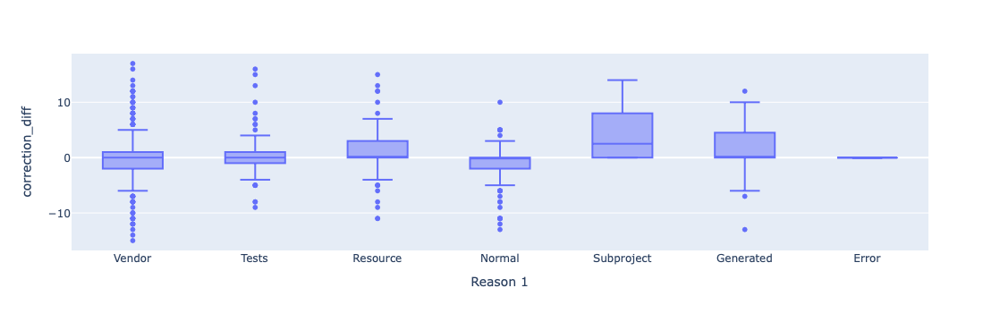

In [ ]:
fig = px.box(intro_correction_data, x='Reason 1', y='correction_diff')
fig.show()

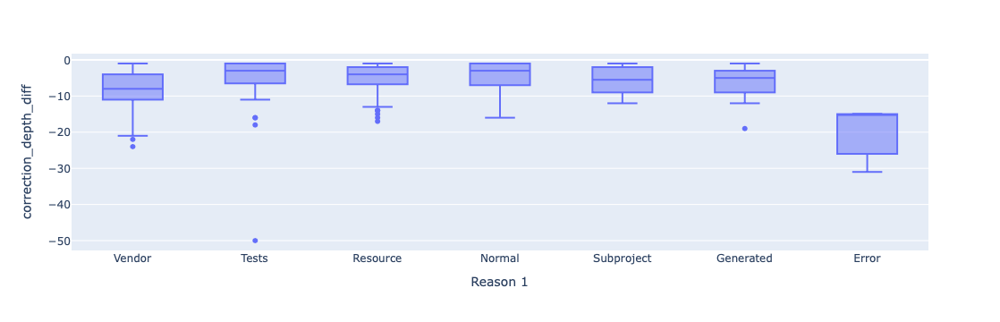

In [ ]:
fig = px.box(intro_correction_data, x='Reason 1', y='correction_depth_diff')
fig.show()

In [ ]:
intro_correction_data.groupby('Reason 1')['correction_diff'].describe()

,count,mean,std,min,25%,50%,75%,max
Reason 1,,,,,,,,
Error,6.0,0.000000,0.000000,0.0,0.0,0.0,0.00,0.0
Generated,36.0,1.777778,4.946058,-13.0,0.0,0.0,5.25,12.0
Normal,103.0,-1.252427,3.864668,-13.0,-2.0,0.0,0.00,10.0
Resource,140.0,1.378571,3.690290,-9.0,0.0,0.0,4.00,15.0
Subproject,7.0,2.571429,3.598942,0.0,0.0,2.0,3.00,10.0
Tests,64.0,0.171875,3.881395,-9.0,-1.0,0.0,1.00,13.0
Vendor,283.0,-0.014134,5.256520,-15.0,-2.0,0.0,2.00,17.0


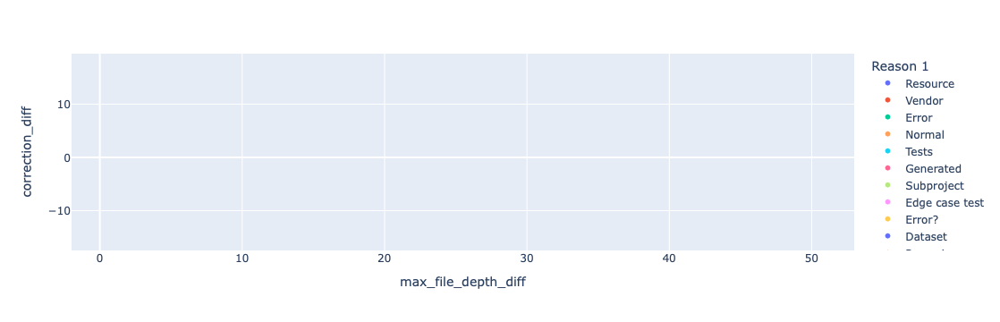

In [ ]:
fig = px.scatter(intro_correction_data, x='max_file_depth_diff', y='correction_diff', color='Reason 1')
fig.show()

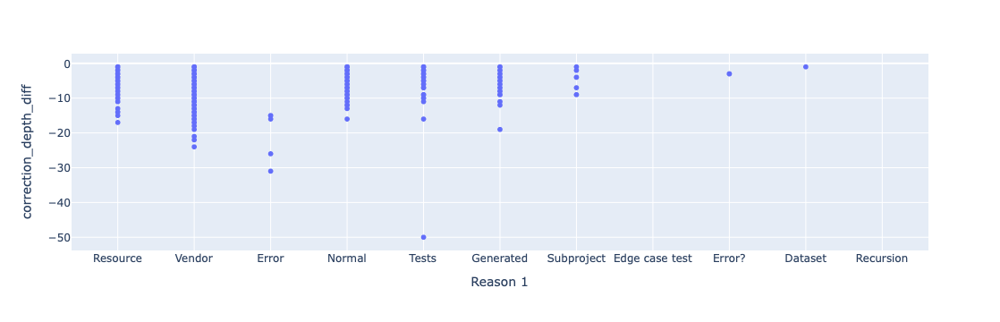

In [ ]:
fig = px.scatter(intro_correction_data, x='Reason 1', y='correction_depth_diff')
fig.show()

In [ ]:
intro_correction_data['correction_after'] = intro_correction_data['correction_time'] - intro_correction_data['commit_time']

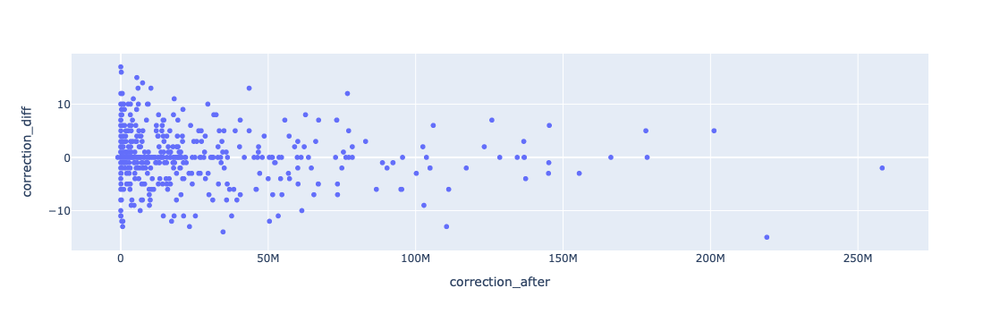

In [ ]:
fig = px.scatter(intro_correction_data, y='correction_diff', x='correction_after')
fig.show()

### Number of files per layer

In [ ]:
df_avg_file_per_lay = ddf_commits[['repo_id', 'commit_index', 'commit_id', 'total_files_per_level']].compute()

In [ ]:
df_avg_file_per_lay['total_files_per_level'] = df_avg_file_per_lay['total_files_per_level'].apply(lambda x: [int(num) for num in x.split(',')])

In [ ]:
# Explode the lists into rows while keeping track of their original indices
df_avg_file_per_lay_exploded = df_avg_file_per_lay.explode('total_files_per_level')

In [ ]:
df_avg_file_per_lay_exploded['index'] = df_avg_file_per_lay_exploded.groupby(['repo_id', 'commit_id']).cumcount()

In [ ]:
# Convert total_files_per_level from object to int
df_avg_file_per_lay_exploded['total_files_per_level'] = df_avg_file_per_lay_exploded['total_files_per_level'].astype(int)

In [ ]:
# Compute the mean for each level (index) per repo_id
mean_per_level = df_avg_file_per_lay_exploded.groupby(['repo_id', 'index'])['total_files_per_level'].mean().reset_index()

In [ ]:
mean_per_level = mean_per_level[~mean_per_level['repo_id'].isin(['kgn_kgnautolayout', 'packtpublishing_swift-3-functional-programming', 'napalm-automation_napalm'])]

In [ ]:
# Pivot the result to get back to the nested list structure
df_avg_file_per_lay_pivoted = mean_per_level.pivot(index='repo_id', columns='index', values='total_files_per_level')

In [ ]:
df_avg_file_per_lay_piv_merge = df_avg_file_per_lay_pivoted.merge(df_repoinfos[['lang']], left_on='repo_id', right_index=True)

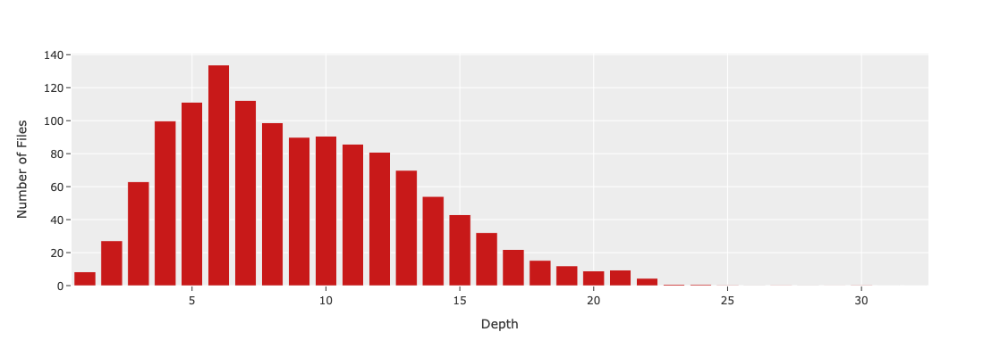

In [ ]:
fig_data = df_avg_file_per_lay_pivoted.mean()
fig = px.bar(x=fig_data.index+1,y=fig_data)    
fig.add_vline(x=49, line_dash="dot", line_color="grey", line_width=2, opacity=1)

# Add an annotation explaining the break
# fig.add_annotation(
#     x=19.6, y=max(df_avg_file_per_lay_pivoted.fillna(0).mean())*0.5,
#     text="Beyond 34 no files found, except the error commits", showarrow=False, font=dict(size=12, color='grey'), textangle=-90
# )

fig.update_layout(height=400, width=1000, showlegend=False, template='ggplot2')
fig.update_xaxes(title="Depth", range=[0.5, 32.5])
fig.update_yaxes(title="Number of Files")
fig.update_traces(marker_color="rgb(200,25,25)")
fig.show()
fig.write_image('Figures/bar_overall_num_of_files_per_lay.pdf')